In [39]:
# Importation des librairies logicielles utilisées

# Librairies dédiées au traitement d'images
import skimage # scikit-image, qui contient toutes les fonctions que nous allons utiliser
import numpy as np # numpy, utilisée par scikit-image pour transformer les images en tableaux à plusieurs dimensions

# Librairies utilitaires
import pathlib # Pour charger automatiquement le dataset d'images
import math
import random
import matplotlib # matplotlib, pour l'affichage des images et graphiques va nous être util pour les histogrammes 
import matplotlib.pyplot as plt

In [40]:
# Importation du dataset d'images
images = [f for f in pathlib.Path(r'C:\Users\adjak\desktop\L3ISEI\traitement image\eval\images').iterdir()] # Récupération automatique des images sous la forme d'un tableau de WindowsPath

print(len(images)) # Affiche la longueur de la liste pour vérification ici correspond à 9



9


In [ ]:
# la dans les cellules suivantes ca va correspondre à toutes les fonctions qu'on va utiliser on d'abord les définir

In [41]:
# Fonction pour afficher une image et son histogramme en noir et blanc
def afficherImgHist(img, axes, bins=256, titre=None):
    """
    Affiche une image, son histogramme et son histogramme cumulatif (sans couleur).
    
    - img : L'image à afficher
    - axes : Une liste contenant les emplacements où afficher l'image et l'histogramme
    - bins : Nombre de divisions pour l'histogramme (par défaut, 256)
    - titre : Titre à afficher pour l'image
    """
    
    # Séparer les axes pour afficher l'image et l'histogramme
    ax_img, ax_hist = axes  # ax_img pour l'image, ax_hist pour l'histogramme
    
    # Créer un deuxième axe pour l'histogramme cumulatif (superposé à ax_hist)
    ax_cumul = ax_hist.twinx()  

    # Affichage de l'image
    if img.ndim < 3:  # Si l'image est en niveaux de gris (1 seule couche)
        ax_img.imshow(img, cmap=plt.cm.gray)  # Affichage en noir et blanc
    else:
        ax_img.imshow(img, cmap=plt.cm.gray)  # Forcer aussi l'affichage en noir et blanc
    
    ax_img.set_axis_off()  # Cacher les axes autour de l'image
    ax_img.set_title(titre)  # Ajouter un titre

    # Affichage de l'histogramme des pixels (en noir)
    ax_hist.hist(img.ravel(), bins=bins, histtype='step', color='black')  
    ax_hist.set_xlabel('Valeur des pixels')  
    ax_hist.set_xlim(0, 255)  
    ax_hist.set_yticks([])  

    # Affichage de l'histogramme cumulatif (également en noir)
    img_cumul, bins = skimage.exposure.cumulative_distribution(img, bins)  
    ax_cumul.plot(bins, img_cumul, color='black')  # Courbe noire au lieu de rouge
    ax_cumul.set_yticks([])  

    return ax_img, ax_hist, ax_cumul


In [ ]:
# centerCrop : Fonction pour recadrer une image autour de son centre
def centerCrop(img, width=None, height=None):
    """
    Découpe une image à partir de son centre en utilisant une taille définie.
    
    - img : L'image à recadrer
    - width : Largeur désirée (optionnel, sinon prise de la hauteur)
    - height : Hauteur désirée (optionnel, sinon prise de la largeur)
    
    Si seule une dimension est donnée, l'autre prendra la même valeur pour un crop carré.
    """

    # Vérifie qu'au moins une dimension est spécifiée
    assert width or height, "Il faut spécifier une largeur ou une hauteur pour recadrer l'image."

    # Si une seule dimension est fournie, l'autre prend la même valeur (recadrage carré)
    width = width or height  
    height = height or width  

    # Obtiens la taille d'origine de l'image
    org_height, org_width = img.shape[:2]  

    # Détermine le centre de l'image
    cropCenter_x, cropCenter_y = org_width // 2, org_height // 2  

    # Calcule la moitié des dimensions demandées (distance entre le centre et le bord du crop)
    dimCrop_x, dimCrop_y = width // 2, height // 2  

    # Découpe l'image en gardant la partie centrale
    return img[
        cropCenter_y - dimCrop_y : cropCenter_y + dimCrop_y,  
        cropCenter_x - dimCrop_x : cropCenter_x + dimCrop_x  
    ]


In [36]:
# Fonction pour choisir une image aléatoire et la redimensionner à 512x512
def chooseRandomImg(images):
    # Choisir une image au hasard parmi celles présentes dans la liste 'images'
    img = plt.imread(images[random.randint(0, len(images)-1)])  
    
    # Redimensionner l'image à 512x512 pixels
    img_resized = skimage.transform.resize(img, (512, 512), anti_aliasing=True)  # anti_aliasing=True pour améliorer la qualité
    titre = images[random.randint(0, len(images)-1)].name.split('.')[0]  # Extraire le nom de l'image sans l'extension
    return titre, img_resized  # Retourne le nom de l'image et l'image redimensionnée

In [18]:
def resize_and_center_crop(img, target_size=512):
    # Calcul du ratio pour le redimensionnement homothétique
    height, width = img.shape[:2]
    ratio = max(target_size / width, target_size / height)
    
    # Redimensionnement homothétique (préserve les proportions)
    resized_img = skimage.transform.rescale(img, ratio, anti_aliasing=True, channel_axis=-1)
    
    # Recadrage au centre pour obtenir les dimensions cibles exactes
    cropped_img = centerCrop(resized_img, target_size, target_size)
    
    return cropped_img



In [ ]:
# à partir d'ici ça va être l'utilisation des fonctions pour obtenir les résultats souhaité

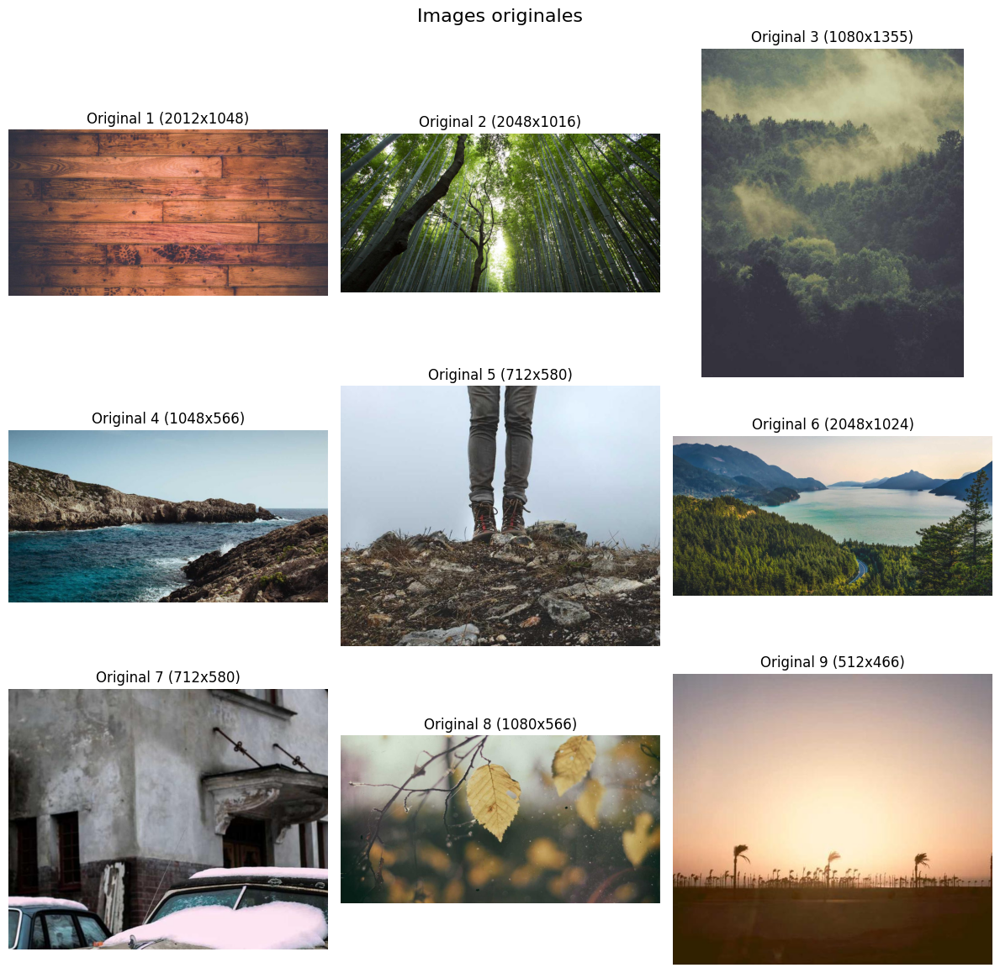

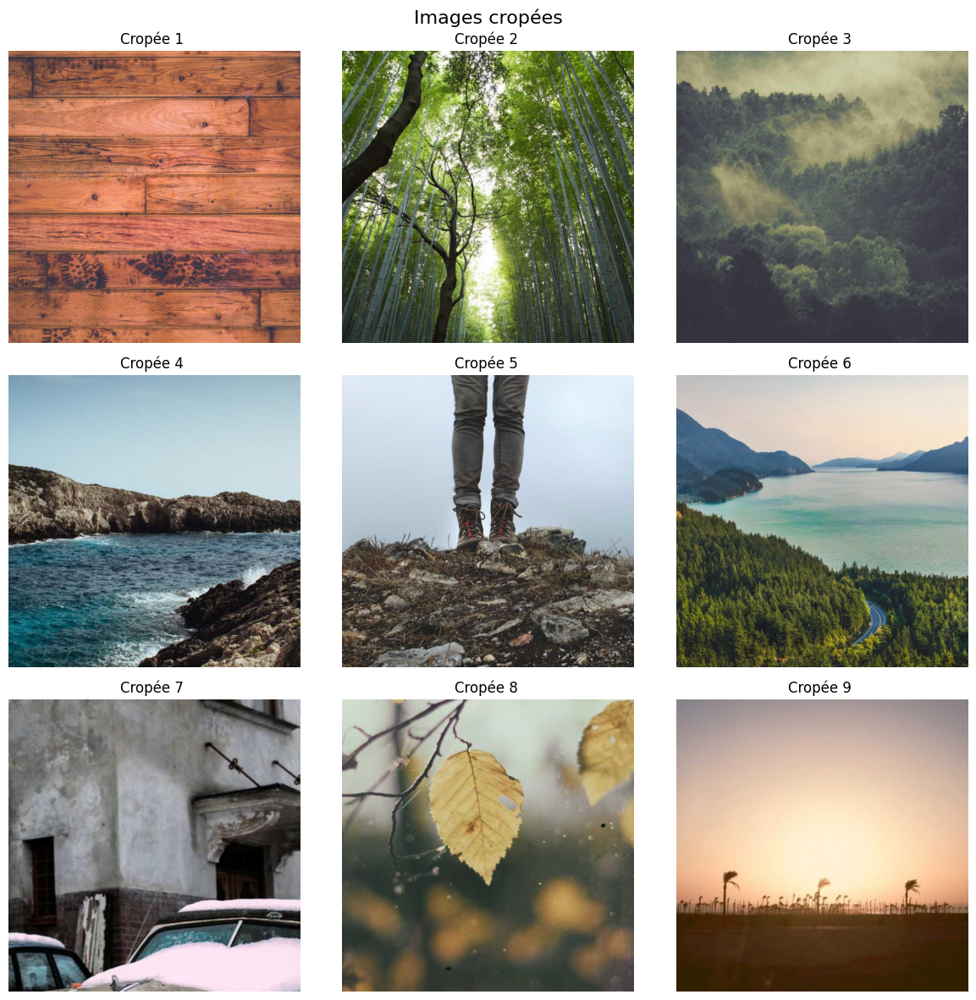

In [44]:
# Affichage de 9 images avec avant/après redimensionnement
colonnes = 3 # On veut une grille de trois colonnes
lignes = 3 # On veut 3 lignes pour avoir 9 images
nombre_images = min(colonnes * lignes, len(images))

# On crée deux figures : une pour les images originales et une pour les images redimensionnées
fig_original, axs_original = plt.subplots(ncols=colonnes, nrows=lignes, figsize=(12,12))
fig_resized, axs_resized = plt.subplots(ncols=colonnes, nrows=lignes, figsize=(12,12))

# On boucle à travers les différents axes
for i in range(nombre_images):
    # Récupération des axes correspondants
    ax_orig = axs_original.flat[i]
    ax_resized = axs_resized.flat[i]
    
    # Désactivation des axes
    ax_orig.set_axis_off()
    ax_resized.set_axis_off()
    
    # Chargement de l'image
    img = plt.imread(images[i])
    
    # Récupération des dimensions originales
    height, width = img.shape[:2]
    
    # Redimensionnement de l'image
    resized_img = resize_and_center_crop(img)
    
    # Affichage de l'image originale
    if img.ndim < 3: # Si l'image chargée possède moins de trois dimensions (image monocouche en noir et blanc)
        ax_orig.imshow(img, cmap=plt.cm.gray)
        ax_resized.imshow(resized_img, cmap=plt.cm.gray)
    else:
        ax_orig.imshow(img)
        ax_resized.imshow(resized_img)
    
    # Ajout de titres avec les dimensions
    ax_orig.set_title(f"Original {i+1} ({width}x{height})") # ici on affiche les dimensions initiales des images 
    ax_resized.set_title(f"Cropée {i+1} ") # ici on va toutes les mettre à la même longueur et largeur

# Désactivation des axes restants si nombre_images < colonnes * lignes
for i in range(nombre_images, colonnes * lignes):
    axs_original.flat[i].set_axis_off()
    axs_resized.flat[i].set_axis_off()

fig_original.suptitle("Images originales", fontsize=16)
fig_resized.suptitle("Images cropées", fontsize=16)

fig_original.tight_layout()
fig_resized.tight_layout()

Valeurs p2: 2.0, p98: 250.0
Min/Max avant: 0/255
Min/Max après: 0/255


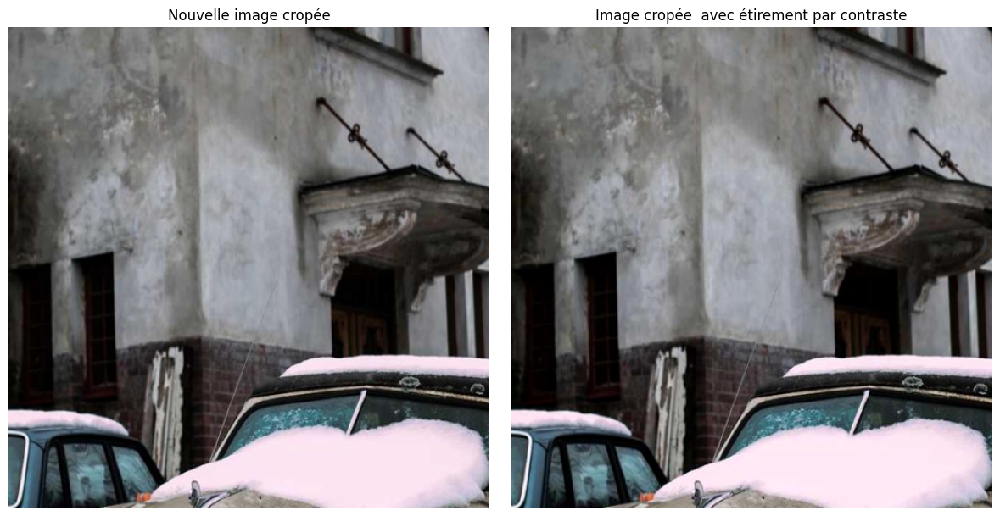

In [42]:

titre, img = chooseRandomImg(images)
result = resize_and_center_crop(img)

# Vérifier que l'image est au bon format pour le traitement
# Si l'image a des valeurs flottantes entre 0 et 1, convertir en uint8 (0-255)
if result.dtype == np.float64 or result.dtype == np.float32:
    if result.max() <= 1.0:
        result = (result * 255).astype(np.uint8)

# Appliquer le contrast stretching
p2, p98 = np.percentile(result, (2, 98))
print(f"Valeurs p2: {p2}, p98: {p98}")  # Debugging - vérifier les valeurs
resultStretch = skimage.exposure.rescale_intensity(result, in_range=(p2, p98))

# Vérifier les valeurs min/max avant et après stretching
print(f"Min/Max avant: {result.min()}/{result.max()}")
print(f"Min/Max après: {resultStretch.min()}/{resultStretch.max()}")

# Affichage des résultats
fig, axs = plt.subplots(ncols=2, nrows=1, figsize=(12, 6))

axs[0].imshow(result)
axs[0].set_title('Nouvelle image cropée')
axs[0].set_axis_off()

axs[1].imshow(resultStretch)
axs[1].set_title('Image cropée  avec étirement par contraste')
axs[1].set_axis_off()

fig.tight_layout()  # Ajustement automatique de la disposition pour que tout soit bien positionné
plt.show() # montre le résultat

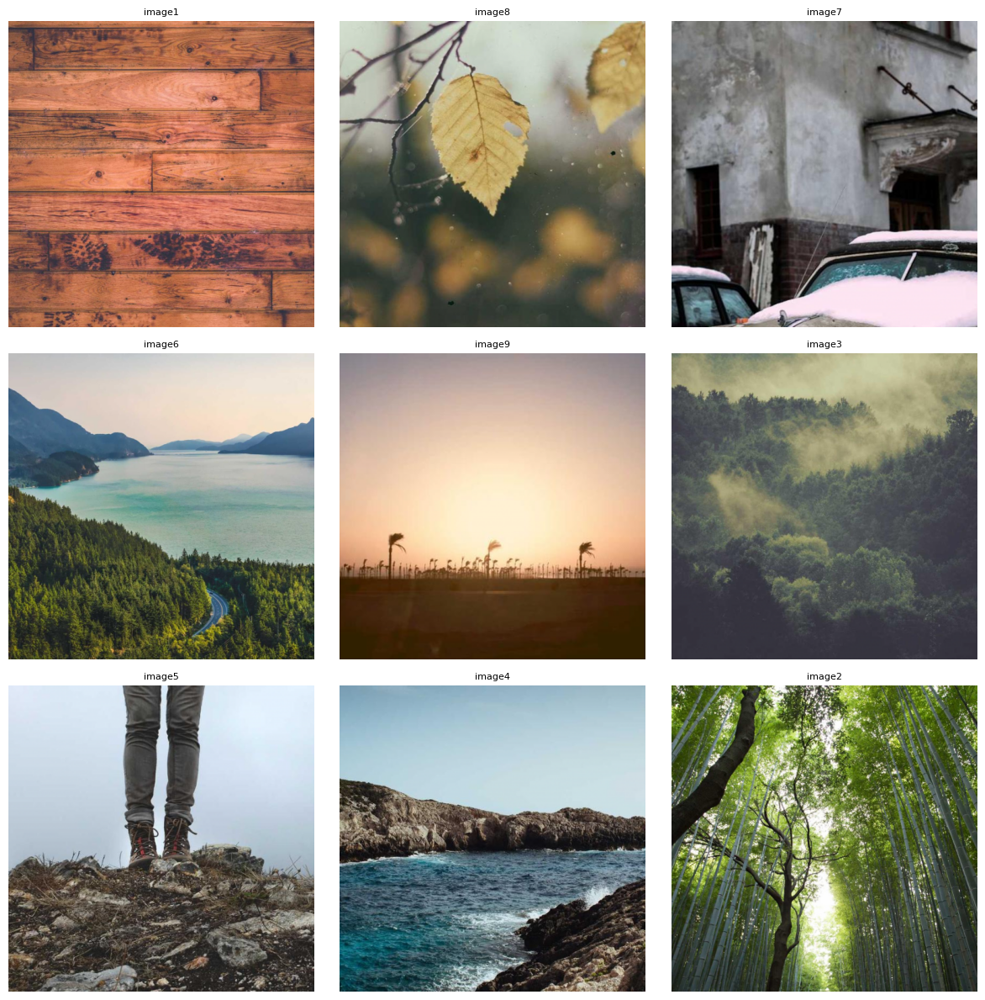

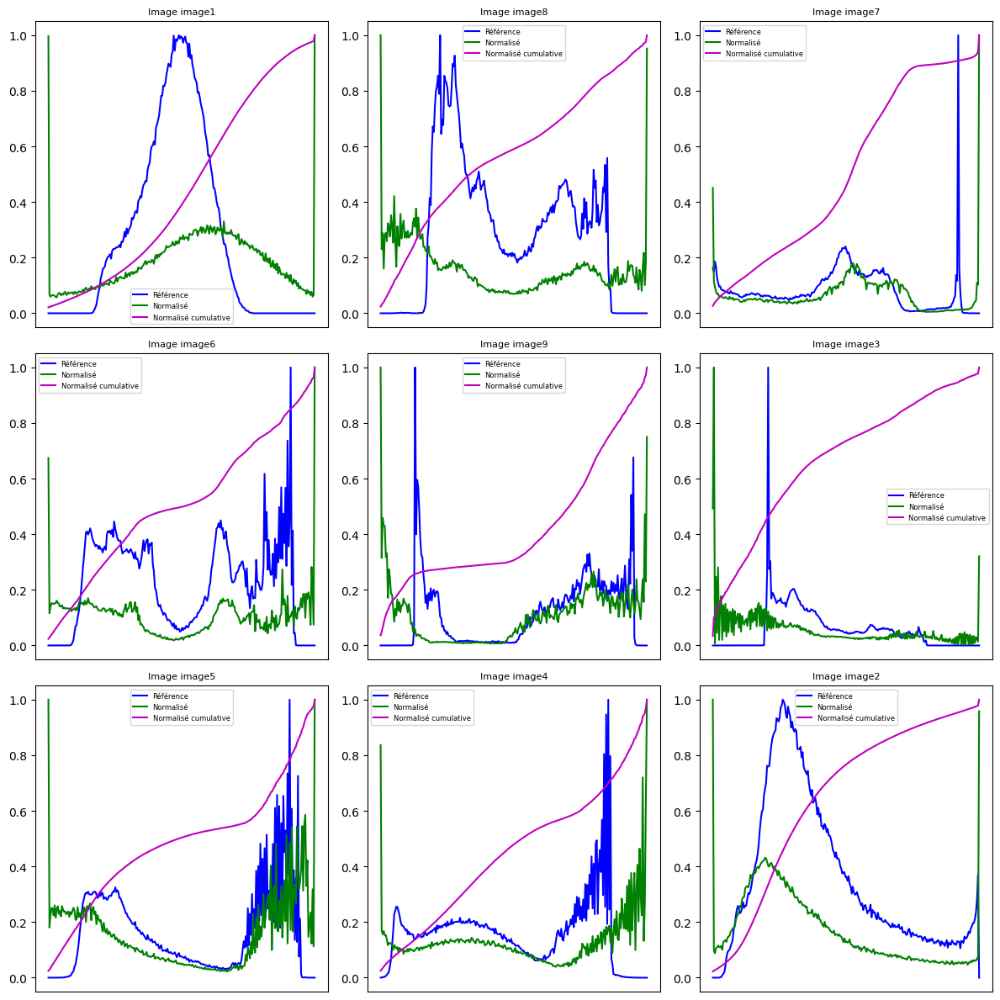

In [ ]:
colonnes = 3 # on indique le nombre de colonnes 

lignes = 3 # on indique le nombre de lignes
nombre_images = min(colonnes * lignes, len(images))
# Affichage d'une grille de 3×3 avec les images, et d'une autre grille de 3×3 avec les histogrammes normalisés
# Création de deux figures séparées pour afficher les images et les histogrammes
fig_images, axs_images = plt.subplots(nrows=lignes, ncols=colonnes, figsize=(12, 12))
fig_histo, axs_histo = plt.subplots(nrows=lignes, ncols=colonnes, figsize=(12, 12))

# Sélection de 9 images aléatoires sans répétition
indices = random.sample(range(len(images)), nombre_images)

# Affichage des images
for i, index in enumerate(indices):
    row, col = i // colonnes, i % colonnes
    ax_img = axs_images[row, col]
    ax_hist = axs_histo[row, col]
    
    # Configuration de l'affichage des images
    ax_img.set_axis_off()
    
    # Chargement et affichage de l'image
    img = plt.imread(images[index])
    
    # Redimensionnement et centrage par le milieu
    img_resized = resize_and_center_crop(img, target_size=512)
    
    # Vérifier que l'image est au bon format pour le traitement
    if img_resized.dtype == np.float64 or img_resized.dtype == np.float32:
        if img_resized.max() <= 1.0:
            img_resized = (img_resized * 255).astype(np.uint8)
    
    # Affichage de l'image redimensionnée et centrée
    if img_resized.ndim < 3:  # Image en noir et blanc
        ax_img.imshow(img_resized, cmap=plt.cm.gray)
    else:
        ax_img.imshow(img_resized)
    ax_img.set_title(images[index].name.split(".")[0], fontsize=8)
    
    # Conversion en niveaux de gris pour l'histogramme
    if img_resized.ndim == 3:  # Image en couleur
        img_gray = skimage.color.rgb2gray(img_resized)
    else:  # Déjà en niveaux de gris
        img_gray = img_resized
    
    # Normalisation de l'histogramme avec rescale_intensity
    p2, p98 = np.percentile(img_gray, (2, 98))
    img_norm = skimage.exposure.rescale_intensity(img_gray, in_range=(p2, p98))
    
    # Calcul des histogrammes (original et normalisé)
    hist, bins = np.histogram(img_gray.flatten(), bins=256, range=(0, 1))
    hist_norm, bins_norm = np.histogram(img_norm.flatten(), bins=256, range=(0, 1))
    
    # Calcul des histogrammes cumulatifs
    hist_cum = np.cumsum(hist)
    hist_cum = hist_cum / hist_cum.max()  # Normalisation
    
    hist_norm_cum = np.cumsum(hist_norm)
    hist_norm_cum = hist_norm_cum / hist_norm_cum.max()  # Normalisation
    
    # Affichage des histogrammes
    ax_hist.plot(bins[:-1], hist / hist.max(), 'b-', label='Référence')
    ax_hist.plot(bins_norm[:-1], hist_norm / hist_norm.max(), 'g-', label='Normalisé')
    ax_hist.plot(bins_norm[:-1], hist_norm_cum, 'm-', label='Normalisé cumulative')
  
    ax_hist.legend(fontsize=6)
    
    # Ajouter le titre de l'histogramme pour indiquer l'image correspondante
    ax_hist.set_title(f'Image {images[index].name.split(".")[0]}', fontsize=8)
    ax_hist.set_xticks([])

# Ajustement de la mise en page
fig_images.tight_layout()
fig_histo.tight_layout()

# Affichage
plt.show()

In [22]:
# Fonction pour l'image en N&B
def traitement_nb(img, ax):
    img_nb = skimage.color.rgb2gray(img)
    ax.imshow(img_nb, cmap=plt.cm.gray)
    ax.set_title('Image en N&B')
    ax.set_axis_off()
    return img_nb

In [23]:

# Fonction pour l'image teintée aléatoirement
def traitement_teinte(img_nb, ax):
    img_tint = skimage.color.gray2rgb(img_nb)
    random_multiplier = [random.randint(1,100)/100, random.randint(1,100)/100, random.randint(1,100)/100]
    img_tint = img_tint * random_multiplier
    ax.imshow(img_tint)
    ax.set_title('Image N&B teintée aléatoirement')
    ax.set_axis_off()
    return img_tint

In [24]:
# Fonction pour le seuillage HSV
def traitement_seuillage_hsv(img, ax):
    hsv_img = skimage.color.rgb2hsv(img)
    hue_img = hsv_img[:, :, 0]
    val_img = hsv_img[:, :, 2]
    hue_threshold = 0.04
    val_threshold = 0.02
    bin_img = (hue_img > hue_threshold) | (val_img < val_threshold)
    ax.imshow(bin_img, cmap=plt.cm.gray)
    ax.set_title('Image seuillée en HSV')
    ax.set_axis_off()
    return bin_img

In [25]:

# Fonction pour le débruitage non-local
def traitement_denoising_nl(img, ax):
    sigma = 0.2
    noisy_img = skimage.util.random_noise(img, var=sigma**2)
    sigma_est = np.mean(skimage.restoration.estimate_sigma(noisy_img, channel_axis=-1))
    patch_kw = dict(patch_size=5, patch_distance=6, channel_axis=-1)
    denoised_nl = skimage.restoration.denoise_nl_means(noisy_img, h=0.8 * sigma_est, 
                                                      sigma=sigma_est, fast_mode=True, **patch_kw)
    ax.imshow(denoised_nl)
    ax.set_title('Débruitage non-local')
    ax.set_axis_off()
    return denoised_nl

In [26]:
# Fonction pour l'inpainting
def traitement_inpainting(img, ax):
    mask = np.zeros(img.shape[:-1], dtype=bool)
    rstate = np.random.default_rng(0)
    for radius in [2, 4, 8, 16]:
        thresh = 3 + 0.25 * radius
        tmp_mask = rstate.standard_normal(img.shape[:-1]) > thresh
        if radius > 0:
            tmp_mask = skimage.morphology.binary_dilation(tmp_mask, 
                                                        skimage.morphology.disk(radius, dtype=bool))
        mask[tmp_mask] = 1

    img_defects = img * ~mask[..., np.newaxis]
    img_inpainted = skimage.restoration.inpaint_biharmonic(img_defects, mask, channel_axis=-1)
    ax.imshow(img_inpainted)
    ax.set_title('Inpainting')
    ax.set_axis_off()
    return img_inpainted

In [27]:
# Fonction pour le débruitage par Total Variation
def traitement_denoising_tv(img, ax):
    sigma = 0.2
    noisy_img = skimage.util.random_noise(img, var=sigma**2)
    denoised_tv = skimage.restoration.denoise_tv_chambolle(noisy_img, weight=0.2, channel_axis=-1)
    ax.imshow(denoised_tv)
    ax.set_title('Débruitage Total Variation')
    ax.set_axis_off()
    return denoised_tv

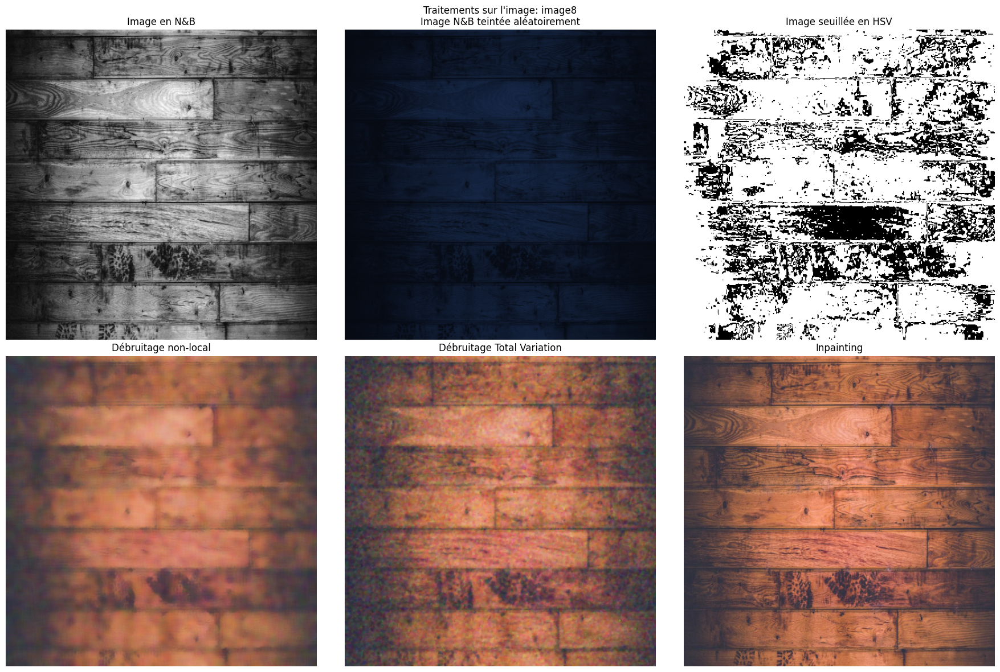

In [43]:
# Chargement d'une image aléatoire et redimensionnement à 512x512
titre, img_base = chooseRandomImg(images)

# Création de la figure avec une grille 2x3
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(18, 12))

# Application des traitements sur la ligne du haut
img_nb = traitement_nb(img_base, axs[0, 0])
traitement_teinte(img_nb, axs[0, 1])
traitement_seuillage_hsv(img_base, axs[0, 2])

# Application des traitements sur la ligne du bas
traitement_denoising_nl(img_base, axs[1, 0])
traitement_denoising_tv(img_base, axs[1, 1])
traitement_inpainting(img_base, axs[1, 2])

# Finalisation de la figure
fig.suptitle(f'Traitements sur l\'image: {titre}', fontsize=12)
fig.tight_layout()
plt.show()